In [1]:
%matplotlib inline
%config InlineBackend.print_figure_kwargs={'bbox_inches': 'tight'}
import cv2 as cv
import numpy as np
import scipy as sp
import scipy.stats
import math as m
import matplotlib as mpl
mpl.rcParams['savefig.dpi'] = 96
mpl.rcParams['figure.dpi'] = 96
import matplotlib.pyplot as plt
from omrtemplate import get_template_rois
from pyzbar.pyzbar import decode


In [2]:
SHOW_PROCESSING_STEPS = True
FIGSIZE=(15.5, 23)
# FIGSIZE=(5, 8)
CONTOUR_EPS = 0.02
COMPACTNESS_EPS = 0.1
AREA_EPS = 0.7
CLOSENESS_EPS = 1.5
CLAHE_CLIPLIMIT = 2.0
BLUR_KSIZE = 3
THRESH_BLOCK_SIZE = 33

In [3]:
TEMPLATE_PATH = './response-sheet.svg'
SCAN_PATH = 'samples/omr_scan_012.jpg'

In [4]:
# Load the image
import copy
import pickle
img_rgb = cv.imread(SCAN_PATH)

# Convert to gray tones
img_gray = cv.cvtColor(img_rgb, cv.COLOR_BGR2GRAY)
print(len(img_gray))
# print(decode(img_gray))
# Decode the QR-code
# qrcode = decode(img_gray)[0]
qrcode = None
# y = copy.copy(qrcode)
# with open('temp.pkl', 'wb') as output:
#     pickle.dump(y, output, pickle.HIGHEST_PROTOCOL)
with open('temp.pkl', 'rb') as input:
    qrcode = pickle.load(input)
#     print(qrcode)
# print(qrcode, y)
qrdata = qrcode.data.decode('utf-8').split()
department_id = qrdata[0]
course_id = qrdata[1]
exam_date = qrdata[2]
variants_count = int(qrdata[3])
questions_count = int(qrdata[4])
#print(variants_count)
#print(qrdata)

3509


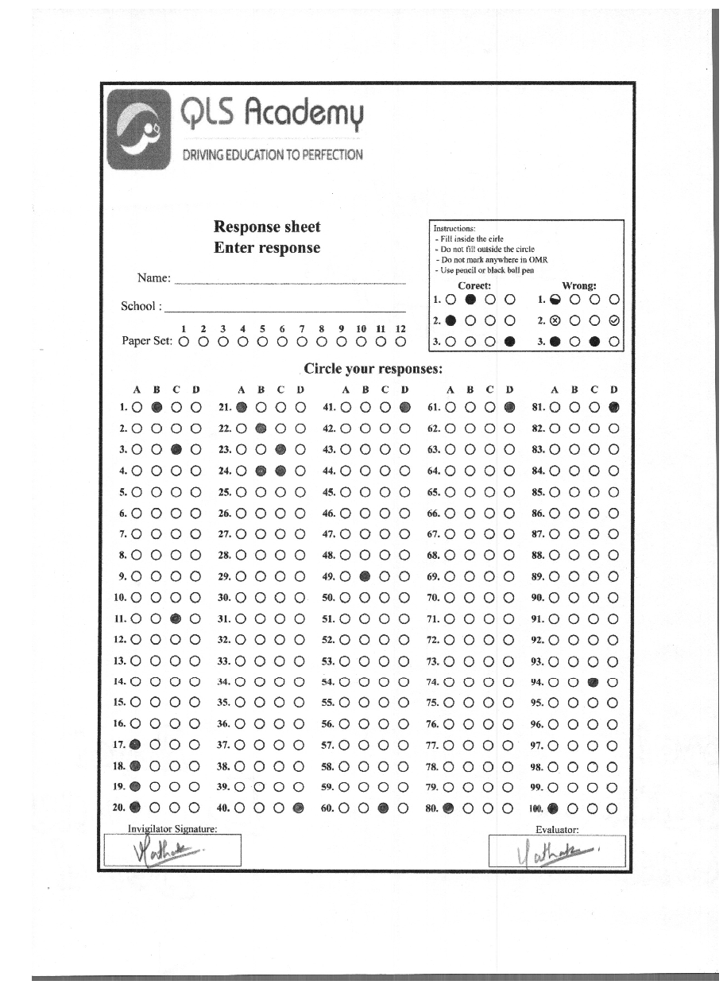

In [5]:
mx = 0
my = 0
for p in qrcode.polygon:
    mx = mx + p.x
    my = my + p.y
    
mx = mx / 4
my = my / 4

height = img_gray.shape[0]
width = img_gray.shape[1]
img_corners = {(0, 0): 1, (width, 0): 0, (0, height): 2, (width, height): 3}
min_dist = m.sqrt(height**2 + width**2)
rotation_count = 0
for k in img_corners:
    dist = m.sqrt((mx-k[0])**2 + (my-k[1])**2)
    if min_dist > dist:
        min_dist = dist
        rotation_count = img_corners[k]

# Rotate the image such that the page is correctly oriented
for c in range(rotation_count):
    img_gray = cv.transpose(img_gray)
    img_gray = cv.flip(img_gray, flipCode=1)

# qrcode = decode(img_gray)[0]
qr_vertices = np.zeros((4, 1, 2), dtype=np.int32)
for idx in range(4):
    p = qrcode.polygon[idx]
    qr_vertices[idx][0][0] = p.x
    qr_vertices[idx][0][1] = p.y

plt.figure(figsize=FIGSIZE)
plt.axis("off")
plt.imshow(img_gray, cmap = plt.cm.gray);

In [6]:
from lxml import etree
import re
import math as m
import numpy as np
def get_transform_matrix(transform_string):
    transform_regex = re.compile('(translate|rotate|scale|skewX|skewY|matrix)\(([^()]*)\)')
    transform_matrix = np.identity(3)
    for xformid, args in transform_regex.findall(transform_string):
        args = [float(a) for a in re.split(r'[^0-9eE+.-]+', args)]
        tm = np.identity(3)
        if xformid == 'translate':
            for idx in range(len(args)):
                tm[idx, 2] = args[idx]
        elif xformid == 'scale':
            if len(args) == 1:
                args = args * 2
            for idx in range(len(args)):
                tm[idx, idx] = args[idx]
        elif xformid == 'matrix':
            for idx in range(len(args)):
                tm[idx%2, idx//2] = args[idx]
        elif xformid == 'skewX':
            tm[0, 1] = m.tan(m.radians(args[0]))
        elif xformid == 'skewY':
            tm[1, 0] = m.tan(m.radians(args[0]))
        elif xformid == 'rotate':
            tm[0, 0] =  m.cos(m.radians(args[0]))
            tm[0, 1] = -m.sin(m.radians(args[0]))
            tm[1, 0] =  m.sin(m.radians(args[0]))
            tm[1, 1] =  m.cos(m.radians(args[0]))
            if len(args) > 1:
                pretm = np.identity(3)
                postm = np.identity(3)
                pretm[0, 2] = args[1]
                pretm[1, 2] = args[2]
                postm[0, 2] = -args[1]
                postm[1, 2] = -args[2]
                tm = pretm @ tm @ postm
        
        transform_matrix = transform_matrix @ tm
    return transform_matrix
def get_template_rois(filename):
    tree = etree.parse(open(filename, "r", encoding = 'utf-8'))
    root = tree.getroot()
    
    page_width = root.attrib['width']
    page_height = root.attrib['height']
    # drop units
    units = re.compile(r'[a-zA-Z\s]+')
    try:
        page_width = float(page_width)
    except:
        page_width = float(re.split(units, page_width)[0])
    try:
        page_height = float(page_height)
    except:
        page_height = float(re.split(units, page_height)[0])
    
    qr_root = tree.xpath('//svg:g[starts-with(@inkscape:label, "QR")]',
                           namespaces={'inkscape': 'http://www.inkscape.org/namespaces/inkscape',
                                       'svg': 'http://www.w3.org/2000/svg'})[0]
    qr_width = float(qr_root[0].attrib['width']) - 8*float(qr_root[1].attrib['width'])
    print(float(qr_root[0].attrib['width']), 8*float(qr_root[1].attrib['width']))
    print((qr_root[0].attrib['height']), 8*float(qr_root[1].attrib['height']))
    qr_height = float(qr_root[0].attrib['height']) - 8*float(qr_root[1].attrib['height'])
    ctm = np.identity(3)
    ctm_chain = [qr_root] + list(qr_root.iterancestors())
    ctm_chain.reverse()
    for el in ctm_chain:
        if 'transform' in el.attrib:
            ctm = ctm @ get_transform_matrix(el.attrib['transform'])
    initial_qr_orig = np.array([0, 0, 1.0], ndmin=2).T
    initial_qr_width = np.array([qr_width, 0, 1.0], ndmin=2).T
    initial_qr_height = np.array([0, qr_height, 1.0], ndmin=2).T
    mapped_qr_orig = ctm @ initial_qr_orig
    mapped_qr_width = ctm @ initial_qr_width
    mapped_qr_height = ctm @ initial_qr_height
    qr_x = mapped_qr_orig[0][0]
    qr_y = mapped_qr_orig[1][0]
    qr_width = np.linalg.norm(mapped_qr_orig - mapped_qr_width)
    qr_height = np.linalg.norm(mapped_qr_orig - mapped_qr_height)
    rois_root = tree.findall('{*}g[@inkscape:groupmode="layer"][@inkscape:label="ROIs"]',
                             namespaces={'inkscape': 'http://www.inkscape.org/namespaces/inkscape',
                                        'svg': 'http://www.w3.org/2000/svg'})[0]
    ctm = np.identity(3)
    ctm_chain = [rois_root] + list(rois_root.iterancestors())
    ctm_chain.reverse()
    for el in ctm_chain:
        if 'transform' in el.attrib:
            ctm = ctm @ get_transform_matrix(el.attrib['transform'])
    bounding_rect = None
    answer_bubbles = []
    for el in rois_root:
        tag = etree.QName(el).localname
        if tag == 'rect' or tag == 'circle':
            tm = np.copy(ctm)
            if 'transform' in el.attrib:
                tm = tm @ get_transform_matrix(el.attrib['transform'])
            if tag == 'rect':
                rect_attribs = {k:float(el.attrib[k]) for k in ['x', 'y', 'width', 'height']}
                if 'style' in el.attrib:
                    rect_style = dict(item.split(":") for item in el.attrib['style'].split(";"))
                    if 'stroke-width' in rect_style:
                        rect_attribs['stroke-width'] = float(rect_style['stroke-width'])
                    else:
                        rect_attribs['stroke-width'] = 0.0
                initial_ul = np.array([rect_attribs['x'], rect_attribs['y'], 1.0], ndmin=2).T
                initial_width = initial_ul + np.array([rect_attribs['width'], 0, 0], ndmin=2).T
                initial_height = initial_ul + np.array([0, rect_attribs['height'], 0], ndmin=2).T
                initial_stroke = initial_ul + np.array([rect_attribs['stroke-width'], 0, 0], ndmin=2).T
                mapped_ul = tm @ initial_ul
                mapped_width = tm @ initial_width
                mapped_height = tm @ initial_height
                mapped_stroke = tm @ initial_stroke
                rect_attribs['x'] = mapped_ul[0][0]
                rect_attribs['y'] = mapped_ul[1][0]
                rect_attribs['width'] = np.linalg.norm(mapped_width - mapped_ul)
                rect_attribs['height'] = np.linalg.norm(mapped_height - mapped_ul)
                rect_attribs['stroke-width'] = np.linalg.norm(mapped_stroke - mapped_ul)
            elif tag == 'circle':
                circle_attribs = {k:float(el.attrib[k]) for k in ['cx', 'cy', 'r']}
                initial_c = np.array([circle_attribs['cx'], circle_attribs['cy'], 1.0], ndmin=2).T
                initial_r = initial_c + np.array([circle_attribs['r'], 0, 0], ndmin=2).T
                mapped_c = tm @ initial_c
                mapped_r = tm @ initial_r
                circle_attribs['cx'] = mapped_c[0][0]
                circle_attribs['cy'] = mapped_c[1][0]
                circle_attribs['r'] = np.linalg.norm(mapped_r - mapped_c)

                circle_attribs['id'] = el.attrib['id']
                if 'style' in el.attrib:
                    circle_style = dict(item.split(":") for item in el.attrib['style'].split(";"))
                    if 'stroke-width' in circle_style:
                        circle_attribs['stroke-width'] = float(circle_style['stroke-width'])
                    else:
                        circle_attribs['stroke-width'] = 0.0
                answer_bubbles.append(circle_attribs)
    return ({'height': page_height, 'width': page_width}, 
           {'x': qr_x, 'y': qr_y, 'height': qr_height, 'width': qr_width},
            rect_attribs,
            answer_bubbles)

In [7]:
# get template informations from the svg file
page_dims, qr_dims, bounding_rect, answer_bubbles = get_template_rois(TEMPLATE_PATH)
print(page_dims, qr_dims)
# print(bounding_rect)
# print(answer_bubbles)
# crop the page to edges, in relation to qr shape
qr_deltas = qr_vertices - np.roll(qr_vertices, 1, axis=0)
qr_lengths = [int(np.linalg.norm(d)) for d in qr_deltas]
new_qr_width = max(qr_lengths)
new_qr_height = int(qr_dims['height'] * new_qr_width / qr_dims['width'])
qr_x = qr_vertices[0][0][0]
qr_y = qr_vertices[0][0][1]
new_qr_vertices = np.array([
        [qr_x, qr_y],
        [qr_x, qr_y + new_qr_height - 1],
        [qr_x + new_qr_width - 1, qr_y + new_qr_height - 1],
        [qr_x + new_qr_width - 1, qr_y]], dtype = "float32")
resh_qr_vertices = np.float32(np.reshape(qr_vertices, (4, 2)))

6.0 48.0
6 48.0
{'height': 297.0, 'width': 210.0} {'y': 10.999991, 'height': 11.112486000000001, 'x': 140.60839000000001, 'width': 11.11248599999999}


{'y': 10.999991, 'height': 11.112486000000001, 'x': 140.60839000000001, 'width': 11.11248599999999}


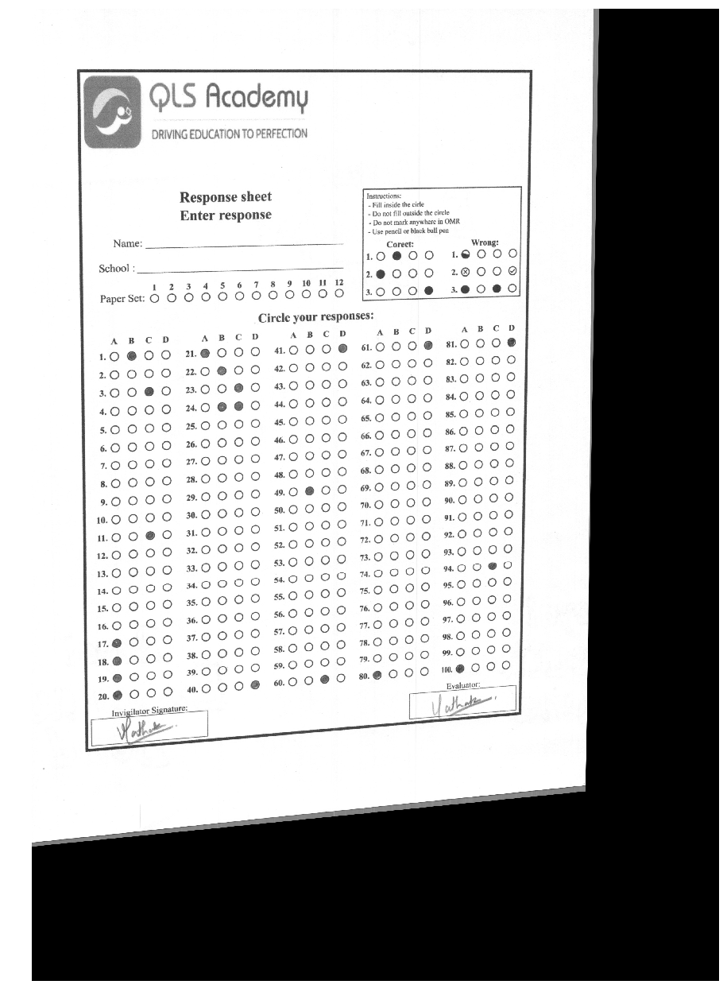

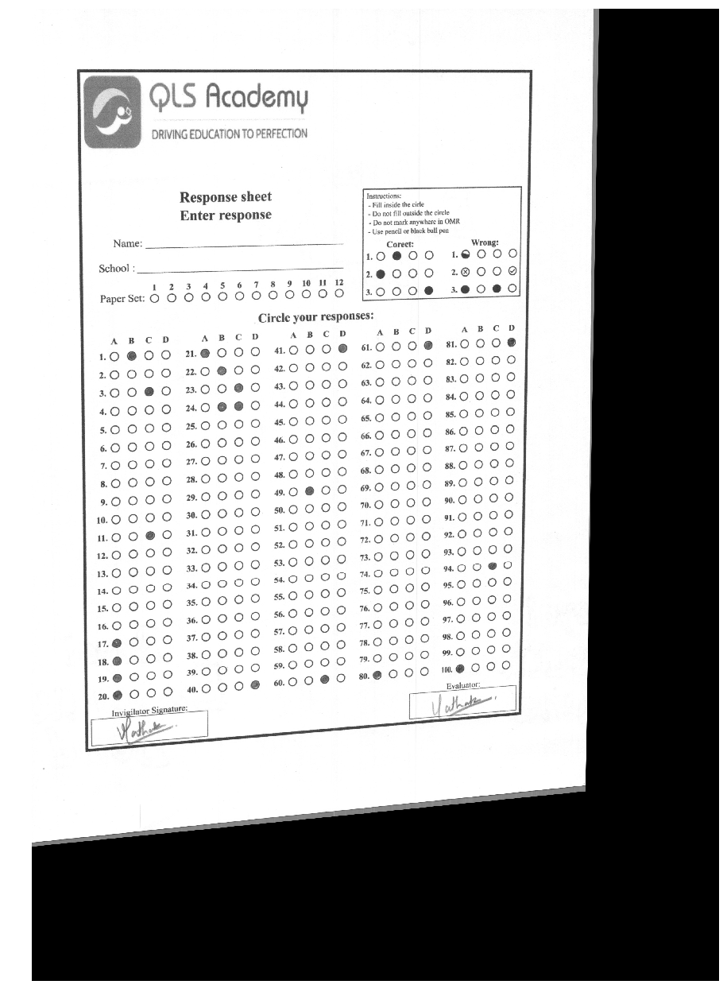

In [8]:
# compute the perspective transform matrix and then apply it
M = cv.getPerspectiveTransform(resh_qr_vertices, new_qr_vertices)
img_qr_box = cv.warpPerspective(img_gray,
                                M,
                                (int(img_gray.shape[1]*1.2), int(img_gray.shape[0]*1.2)))
marg_lx = bounding_rect['x'] / 3
marg_ly = bounding_rect['y'] / 3
marg_rx = (page_dims['width'] - (bounding_rect['x'] + bounding_rect['width'])) / 3
marg_ry = (page_dims['height'] - (bounding_rect['y'] + bounding_rect['height'])) / 3
print(qr_dims)
new_page_xul = int(new_qr_vertices[0][0] - (qr_dims['x'] + marg_lx) * new_qr_width / qr_dims['width'])
if new_page_xul < 0:
    new_page_xul = 0
new_page_yul = int(new_qr_vertices[0][1] - (qr_dims['y'] + marg_ly)* new_qr_height / qr_dims['height'])
if new_page_yul < 0:
    new_page_yul = 0
new_page_xlr = int(new_qr_vertices[0][0] +
                   (page_dims['width'] - qr_dims['x'] - marg_rx) * new_qr_width / qr_dims['width'])
if new_page_xlr > img_qr_box.shape[1]:
    new_page_xlr = img_qr_box.shape[1]
new_page_ylr = int(new_qr_vertices[0][1] +
                   (page_dims['height'] - qr_dims['y'] - marg_ry) * new_qr_height / qr_dims['height'])
if new_page_ylr > img_qr_box.shape[0]:
    new_page_ylr = img_qr_box.shape[0]

if SHOW_PROCESSING_STEPS:
    plt.figure(figsize=FIGSIZE)
    plt.axis("off")
    plt.imshow(img_qr_box, cmap = plt.cm.gray);
# crop the image
img_qr_box = img_qr_box[new_page_yul:new_page_ylr, new_page_xul:new_page_xlr]

if SHOW_PROCESSING_STEPS:
    plt.figure(figsize=FIGSIZE)
    plt.axis("off")
    plt.imshow(img_qr_box, cmap = plt.cm.gray);

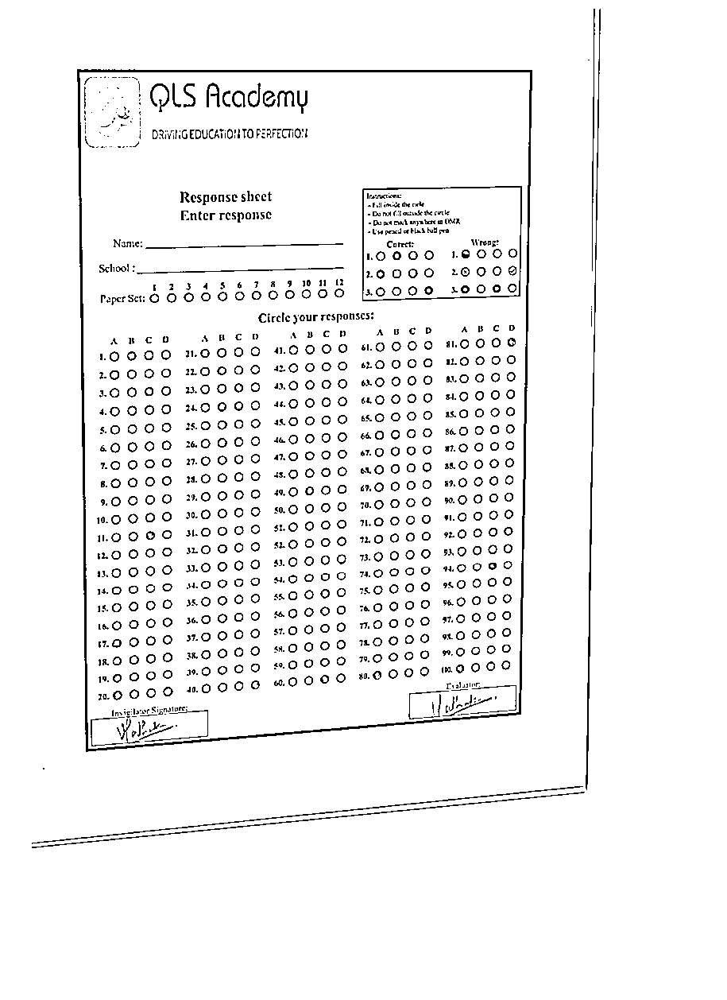

In [9]:
# create a CLAHE object
clahe = cv.createCLAHE(clipLimit=CLAHE_CLIPLIMIT)
# apply CLAHE for better contrast
img_clahe = clahe.apply(img_qr_box)
# img_clahe = clahe

# apply blur
img_blur = cv.GaussianBlur(img_clahe, (15, 15), 0)

# apply adaptive thresholding
img_th = cv.adaptiveThreshold(img_blur, 255, cv.ADAPTIVE_THRESH_GAUSSIAN_C,\
                              cv.THRESH_BINARY, THRESH_BLOCK_SIZE, THRESH_BLOCK_SIZE//2)

if SHOW_PROCESSING_STEPS:
    plt.figure(figsize=FIGSIZE)
    plt.axis("off")
    plt.imshow(img_th, cmap = plt.cm.gray);

In [10]:
# apply dialation
kernel = np.ones((5,5), np.uint8)
img_dialation = cv.dilate(img_th, kernel, iterations = 1)

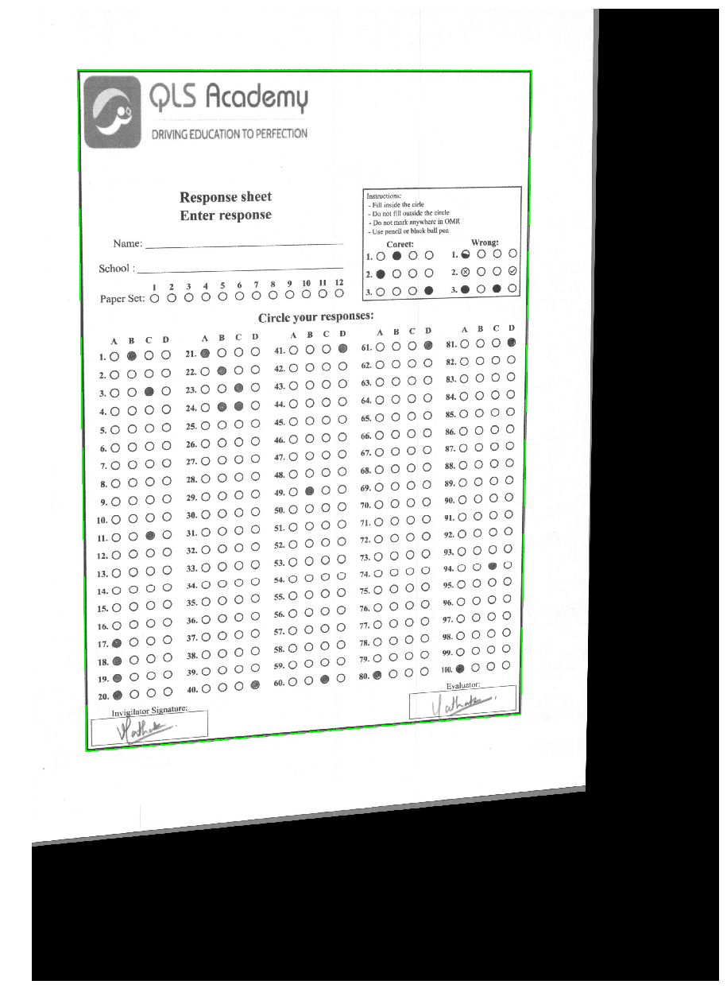

In [11]:
# apply canny edge detection
    
img_canny = cv.Canny(img_dialation, 75, 200)
# find contours in the edged image
_, contours, _ = cv.findContours(img_canny, cv.RETR_LIST, cv.CHAIN_APPROX_NONE)

# select the max area contour
contour = max(contours, key = cv.contourArea)
perimeter = cv.arcLength(contour, True)
approx_contour = cv.approxPolyDP(contour, CONTOUR_EPS * perimeter, True)
vertices = cv.convexHull(approx_contour, clockwise=True)
img_result = cv.drawContours(cv.cvtColor(img_qr_box, cv.COLOR_GRAY2BGR), [vertices], 0, (0,255,0), 3)
if SHOW_PROCESSING_STEPS:
    plt.figure(figsize=FIGSIZE)
    plt.axis("off")
    plt.imshow(img_result);

In [12]:
print(vertices)
# x,y,w,h = cv.boundingRect(approx_contour)
# print(x,y,w,h)
# c = vertices
# print(c) 
# # determine the most extreme points along the contour
# extLeft = tuple(c[c[:, :, 0].argmin()][0])
# extRight = tuple(c[c[:, :, 0].argmax()][0])
# extTop = tuple(c[c[:, :, 1].argmin()][0])
# extBot = tuple(c[c[:, :, 1].argmax()][0])
c = np.ndarray(shape=(4,1,2), dtype=int)
d = np.ndarray(shape=(4,1), dtype=np.ndarray)

c[0][0][0], c[0][0][1] = 203, 280
c[1][0][0], c[1][0][1] = 261, 3213
c[2][0][0], c[2][0][1] = 2132, 3040
c[3][0][0], c[3][0][1] = 2161, 266
print(c)
# vertices = c

[[[ 198  268]]

 [[ 235 3216]]

 [[2117 3055]]

 [[2165  270]]]
[[[ 203  280]]

 [[ 261 3213]]

 [[2132 3040]]

 [[2161  266]]]


In [13]:
box_frac = bounding_rect['stroke-width'] / bounding_rect['width']
norms = [np.linalg.norm(d) for d in vertices]
vertices = np.roll(vertices, -np.argmin(norms), axis=0)
print(vertices)
# vertices = vertices[0:2]+vertices[4:]
deltas = vertices - np.roll(vertices, 1, axis=0)
lengths = [int(np.linalg.norm(d)) for d in deltas]
dim = max(lengths)
new_height = dim
new_width = dim * int(bounding_rect['width'] - bounding_rect['stroke-width']) // \
            int(bounding_rect['height'] - bounding_rect['stroke-width'])
new_vertices = np.array([
        [0, 0],
        [0, new_height - 1],
        [new_width - 1, new_height - 1],
        [new_width - 1, 0]], dtype = "float32")
vertices = np.float32(np.reshape(vertices, (4, 2)))
# compute the perspective transform matrix and then apply it
M = cv.getPerspectiveTransform(vertices, new_vertices)
img_box = cv.warpPerspective(img_qr_box, M, (new_width, new_height))
crop_width = int(np.round(img_box.shape[0] * box_frac))

translate_tm = np.identity(3)
translate_tm[0, 2] = -bounding_rect['x']
translate_tm[1, 2] = -bounding_rect['y']
scale_tm = np.identity(3)
scale_factor = img_box.shape[1] / (bounding_rect['width'] + bounding_rect['stroke-width'])
scale_tm[0, 0] = scale_factor
scale_tm[1, 1] = scale_factor
map_tm = scale_tm @ translate_tm


[[[ 198  268]]

 [[ 235 3216]]

 [[2117 3055]]

 [[2165  270]]]


{'cx': 306, 'id': 'v-1', 'r': 18.0, 'stroke-width': 0.30000001, 'cy': 954}
{'cx': 380, 'id': 'v-2', 'r': 18.0, 'stroke-width': 0.30000001, 'cy': 954}
{'cx': 453, 'id': 'v-3', 'r': 18.0, 'stroke-width': 0.30000001, 'cy': 954}
{'cx': 526, 'id': 'v-4', 'r': 18.0, 'stroke-width': 0.30000001, 'cy': 954}
{'cx': 599, 'id': 'v-5', 'r': 18.0, 'stroke-width': 0.30000001, 'cy': 954}
{'cx': 672, 'id': 'v-6', 'r': 18.0, 'stroke-width': 0.30000001, 'cy': 954}
{'cx': 745, 'id': 'v-7', 'r': 18.0, 'stroke-width': 0.30000001, 'cy': 954}
{'cx': 818, 'id': 'v-8', 'r': 18.0, 'stroke-width': 0.30000001, 'cy': 954}
{'cx': 891, 'id': 'v-9', 'r': 18.0, 'stroke-width': 0.30000001, 'cy': 954}
{'cx': 964, 'id': 'v-10', 'r': 18.0, 'stroke-width': 0.30000001, 'cy': 954}
{'cx': 1037, 'id': 'v-11', 'r': 18.0, 'stroke-width': 0.30000001, 'cy': 954}
{'cx': 1110, 'id': 'v-12', 'r': 18.0, 'stroke-width': 0.30000001, 'cy': 954}
{'cx': 134, 'id': '1-a', 'r': 18.0, 'stroke-width': 0.30000001, 'cy': 1199}
{'cx': 207, 'id': '

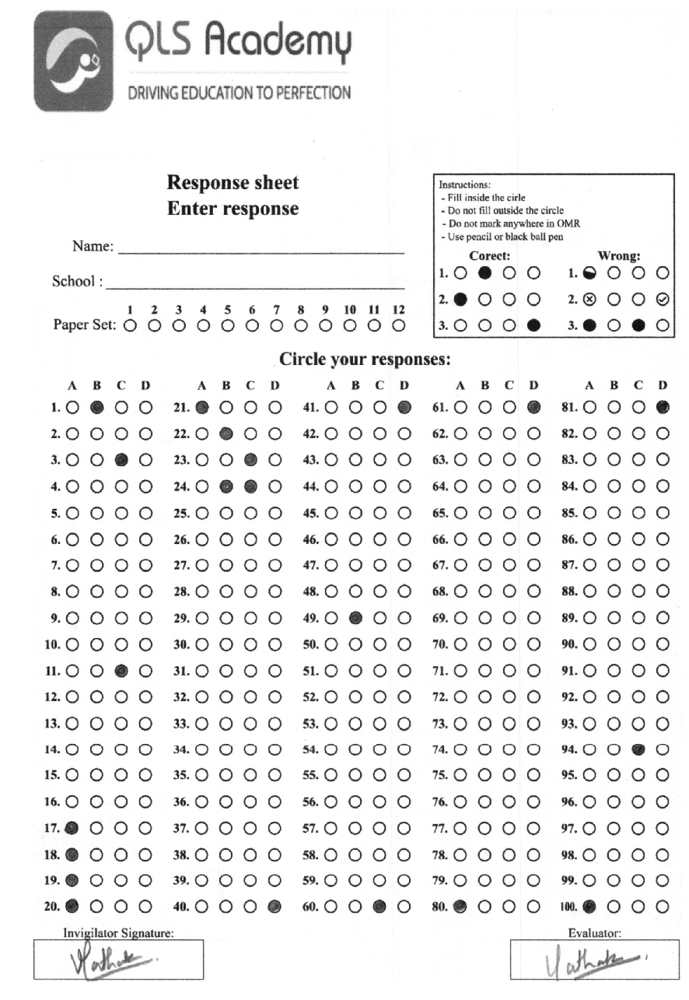

In [14]:
# map bubbles template coordinates to image coordinates
initial_r = np.array([answer_bubbles[0]['r'], 0, 1.0], ndmin=2).T
mapped_r = np.ceil(scale_tm @ initial_r)
circle_r = mapped_r[0][0]
circle_area = m.pi * circle_r**2
circle_peri = 2 * m.pi * circle_r
# print(answer_bubbles)
for idx in range(len(answer_bubbles)):
    initial_coords = np.array([answer_bubbles[idx]['cx'], answer_bubbles[idx]['cy'], 1.0], ndmin=2).T
    mapped_coords = map_tm  @ initial_coords
    answer_bubbles[idx]['cx'] = int(mapped_coords[0,0])
    answer_bubbles[idx]['cy'] = int(mapped_coords[1,0])
    answer_bubbles[idx]['r'] = circle_r
    print(answer_bubbles[idx])
# crop the margins
img_box = img_box[crop_width:img_box.shape[0]-crop_width, crop_width:img_box.shape[1]-crop_width]

if SHOW_PROCESSING_STEPS:
    plt.figure(figsize=FIGSIZE)
    plt.axis("off")
    plt.imshow(img_box, cmap = plt.cm.gray);

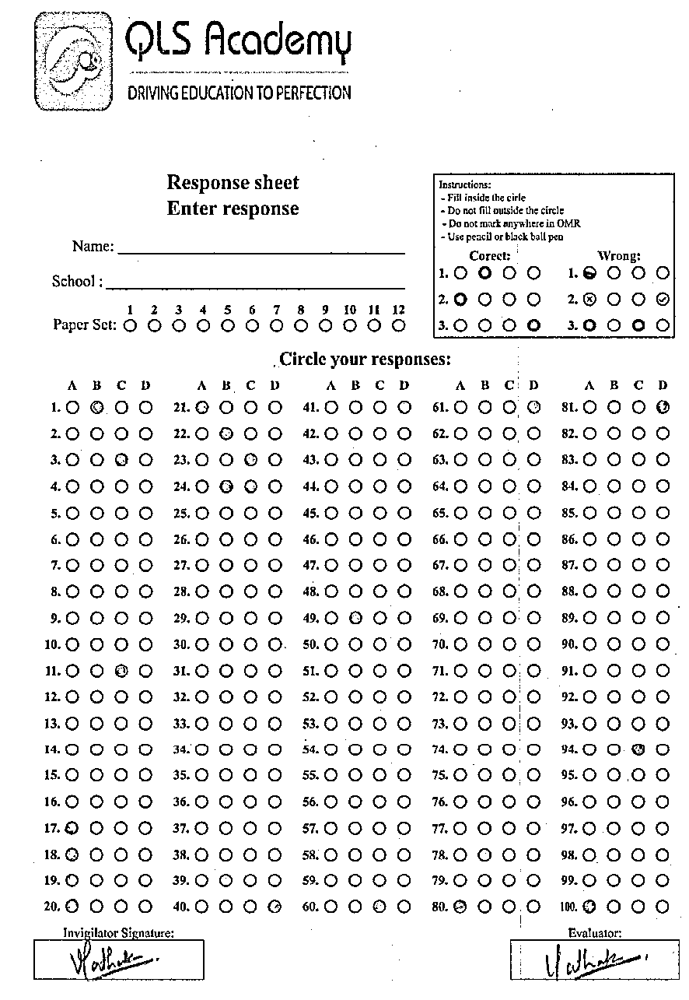

In [15]:
# create a CLAHE object
clahe_box = cv.createCLAHE(clipLimit=CLAHE_CLIPLIMIT)
# apply CLAHE for better contrast
img_box_clahe = clahe.apply(img_box)

# apply blur
img_box_blur = cv.GaussianBlur(img_box_clahe, (BLUR_KSIZE, BLUR_KSIZE), 0)

# apply adaptive thresholding
img_box_th = cv.adaptiveThreshold(img_box_blur, 255, cv.ADAPTIVE_THRESH_GAUSSIAN_C,\
                                  cv.THRESH_BINARY, THRESH_BLOCK_SIZE, THRESH_BLOCK_SIZE//2)

if SHOW_PROCESSING_STEPS:
    plt.figure(figsize=FIGSIZE)
    plt.axis("off")
    plt.imshow(img_box_th, cmap = plt.cm.gray);

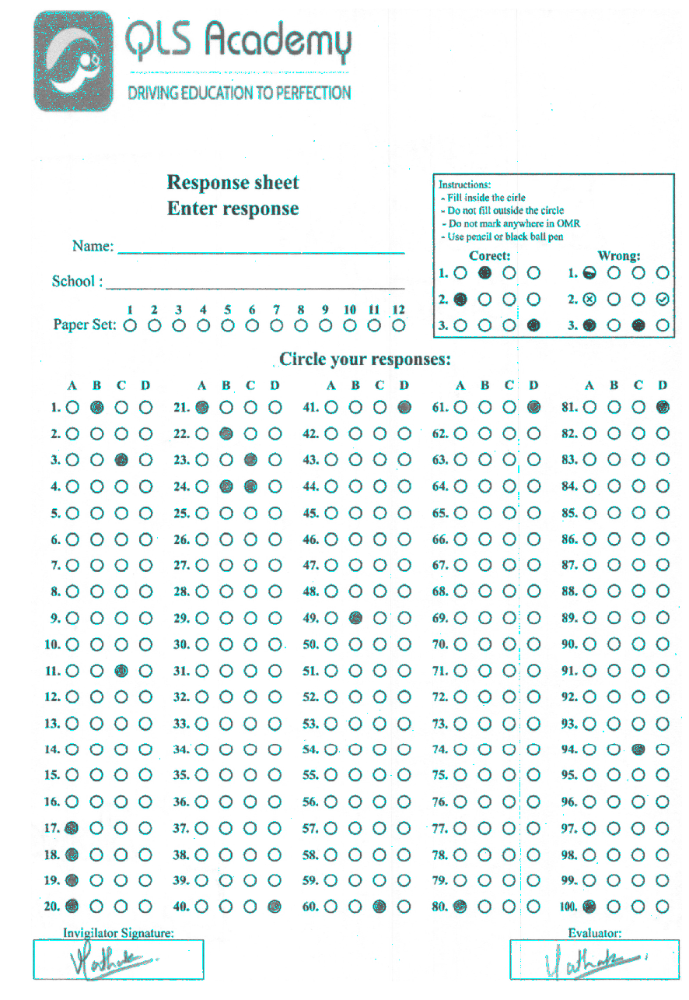

In [16]:
# apply canny edge detection
img_box_canny = cv.Canny(img_box_th, 75, 200)

# find contours in the boxed image
_, box_contours, _ = cv.findContours(img_box_canny, cv.RETR_LIST, cv.CHAIN_APPROX_NONE)


img_box_result = cv.drawContours(cv.cvtColor(img_box, cv.COLOR_GRAY2BGR), box_contours, -1, (0,255,255), 1)

if SHOW_PROCESSING_STEPS:
    plt.figure(figsize=FIGSIZE)
    plt.axis("off")
    plt.imshow(img_box_result);

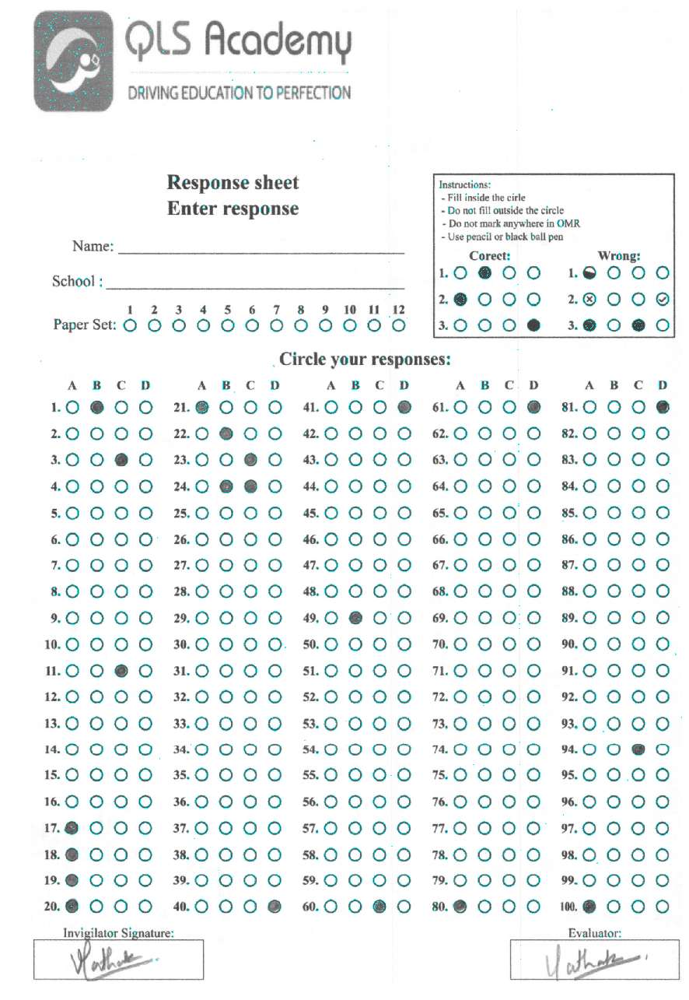

In [17]:
by_compactness_contours = []
for c in box_contours:
    moments = cv.moments(c)
    if moments['mu20']+moments['mu02'] != 0:
        compactness = moments['m00']**2/(2*m.pi*(moments['mu20']+moments['mu02']))
        if abs(compactness - 1) < COMPACTNESS_EPS:
            by_compactness_contours.append(c)

img_box_result = cv.drawContours(cv.cvtColor(img_box, cv.COLOR_GRAY2BGR),
                                 by_compactness_contours, -1, (0,255,255), 1)


if SHOW_PROCESSING_STEPS:
    plt.figure(figsize=FIGSIZE)
    plt.axis("off")
    plt.imshow(img_box_result);

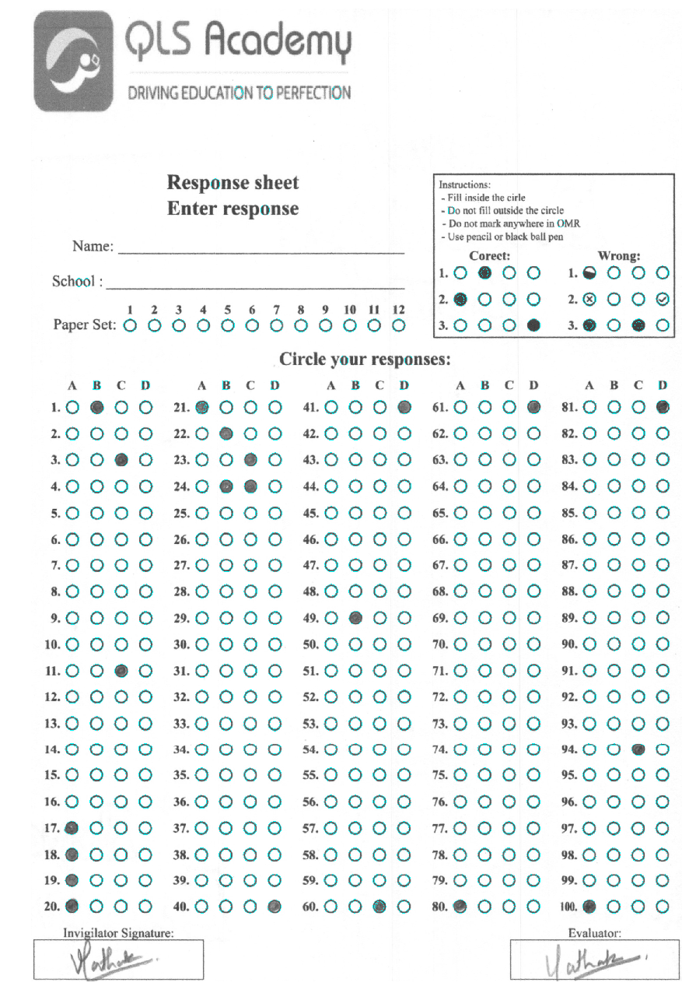

In [18]:
by_area_contours = [c for c in by_compactness_contours \
                    if abs((circle_area - cv.contourArea(c)) / circle_area) <= AREA_EPS]
img_box_result = cv.drawContours(cv.cvtColor(img_box, cv.COLOR_GRAY2BGR),
                                 by_area_contours, -1, (0,255,255), 1)

if SHOW_PROCESSING_STEPS:
    plt.figure(figsize=FIGSIZE)
    plt.axis("off")
    plt.imshow(img_box_result);

In [19]:
# filter contours by selecting only the contours in expected locations
# (i.e. by closeness to the expected locations)
# if several contours are close to the expected locations,
# only select the largest ones

for c in by_area_contours:
    moments = cv.moments(c)
    mx = moments['m10'] / moments['m00']
    my = moments['m01'] / moments['m00']
    min_dist = circle_r * (1 + CLOSENESS_EPS)
    bubble_pair = 0
    for bubble_idx in range(len(answer_bubbles)):
        bubble = answer_bubbles[bubble_idx]
        cx = bubble['cx']
        cy = bubble['cy']
        if min_dist > m.sqrt((cx - mx)**2 + (cy - my)**2):
            min_dist = m.sqrt((cx - mx)**2 + (cy - my)**2)
            bubble_pair = bubble_idx
    if abs(min_dist - circle_r) / circle_r < CLOSENESS_EPS:
        if 'contours' in answer_bubbles[bubble_pair]:
            answer_bubbles[bubble_pair]['contours'].append(c)
        else:
            answer_bubbles[bubble_pair]['contours'] = [c]

for bubble in answer_bubbles:
    if 'contours' in bubble:
        print(bubble)
        max_contour = max(bubble['contours'], key = cv.contourArea)
        moments = cv.moments(max_contour)
        mx = int(moments['m10'] / moments['m00'])
        my = int(moments['m01'] / moments['m00'])
        bubble['mx'] = mx
        bubble['my'] = my
        bubble['optimal_contour'] = max_contour

img_box_result = cv.cvtColor(img_box, cv.COLOR_GRAY2BGR)

{'id': 'v-1', 'contours': [array([[[295, 937]],

       [[296, 936]],

       [[297, 936]],

       [[298, 937]],

       [[299, 937]],

       [[300, 937]],

       [[301, 937]],

       [[302, 938]],

       [[303, 938]],

       [[304, 939]],

       [[305, 940]],

       [[306, 941]],

       [[307, 942]],

       [[308, 943]],

       [[309, 944]],

       [[310, 945]],

       [[310, 946]],

       [[310, 947]],

       [[310, 948]],

       [[310, 949]],

       [[310, 950]],

       [[310, 951]],

       [[310, 952]],

       [[310, 953]],

       [[310, 954]],

       [[310, 955]],

       [[310, 956]],

       [[310, 957]],

       [[309, 958]],

       [[308, 959]],

       [[307, 960]],

       [[306, 961]],

       [[305, 962]],

       [[304, 963]],

       [[303, 964]],

       [[302, 964]],

       [[301, 964]],

       [[300, 964]],

       [[299, 965]],

       [[298, 965]],

       [[297, 965]],

       [[296, 965]],

       [[295, 965]],

       [[294, 965]],

     

{'id': 'v-12', 'contours': [array([[[1100,  937]],

       [[1101,  936]],

       [[1102,  936]],

       [[1103,  936]],

       [[1104,  937]],

       [[1105,  937]],

       [[1106,  938]],

       [[1107,  938]],

       [[1108,  938]],

       [[1109,  939]],

       [[1110,  939]],

       [[1111,  940]],

       [[1112,  941]],

       [[1113,  942]],

       [[1114,  943]],

       [[1115,  944]],

       [[1115,  945]],

       [[1115,  946]],

       [[1116,  947]],

       [[1116,  948]],

       [[1116,  949]],

       [[1116,  950]],

       [[1116,  951]],

       [[1116,  952]],

       [[1115,  953]],

       [[1115,  954]],

       [[1115,  955]],

       [[1115,  956]],

       [[1115,  957]],

       [[1114,  958]],

       [[1114,  959]],

       [[1113,  960]],

       [[1112,  961]],

       [[1111,  962]],

       [[1110,  963]],

       [[1109,  963]],

       [[1108,  964]],

       [[1107,  964]],

       [[1106,  964]],

       [[1105,  964]],

       [[110

{'id': '5-c', 'contours': [array([[[ 265, 1500]],

       [[ 266, 1499]],

       [[ 267, 1499]],

       [[ 268, 1499]],

       [[ 269, 1499]],

       [[ 270, 1499]],

       [[ 271, 1499]],

       [[ 272, 1499]],

       [[ 273, 1499]],

       [[ 274, 1499]],

       [[ 275, 1500]],

       [[ 276, 1500]],

       [[ 277, 1500]],

       [[ 278, 1500]],

       [[ 279, 1501]],

       [[ 280, 1502]],

       [[ 281, 1503]],

       [[ 282, 1504]],

       [[ 283, 1505]],

       [[ 284, 1506]],

       [[ 284, 1507]],

       [[ 284, 1508]],

       [[ 284, 1509]],

       [[ 285, 1510]],

       [[ 285, 1511]],

       [[ 285, 1512]],

       [[ 285, 1513]],

       [[ 285, 1514]],

       [[ 285, 1515]],

       [[ 285, 1516]],

       [[ 285, 1517]],

       [[ 284, 1518]],

       [[ 284, 1519]],

       [[ 284, 1520]],

       [[ 284, 1521]],

       [[ 283, 1522]],

       [[ 282, 1523]],

       [[ 281, 1524]],

       [[ 280, 1524]],

       [[ 279, 1525]],

       [[ 278

{'id': '9-d', 'contours': [array([[[ 340, 1813]],

       [[ 341, 1812]],

       [[ 342, 1812]],

       [[ 343, 1812]],

       [[ 344, 1812]],

       [[ 345, 1812]],

       [[ 346, 1813]],

       [[ 347, 1813]],

       [[ 348, 1813]],

       [[ 349, 1814]],

       [[ 350, 1814]],

       [[ 351, 1815]],

       [[ 352, 1816]],

       [[ 353, 1817]],

       [[ 354, 1818]],

       [[ 355, 1819]],

       [[ 356, 1820]],

       [[ 356, 1821]],

       [[ 357, 1822]],

       [[ 357, 1823]],

       [[ 357, 1824]],

       [[ 358, 1825]],

       [[ 358, 1826]],

       [[ 358, 1827]],

       [[ 358, 1828]],

       [[ 358, 1829]],

       [[ 358, 1830]],

       [[ 358, 1831]],

       [[ 357, 1832]],

       [[ 357, 1833]],

       [[ 357, 1834]],

       [[ 356, 1835]],

       [[ 356, 1836]],

       [[ 355, 1837]],

       [[ 354, 1838]],

       [[ 353, 1839]],

       [[ 352, 1840]],

       [[ 351, 1840]],

       [[ 350, 1841]],

       [[ 349, 1841]],

       [[ 348

{'id': '14-c', 'contours': [array([[[ 265, 2209]],

       [[ 266, 2208]],

       [[ 267, 2208]],

       [[ 268, 2208]],

       [[ 269, 2209]],

       [[ 270, 2209]],

       [[ 271, 2209]],

       [[ 272, 2209]],

       [[ 273, 2209]],

       [[ 274, 2209]],

       [[ 275, 2209]],

       [[ 276, 2210]],

       [[ 277, 2210]],

       [[ 278, 2210]],

       [[ 279, 2211]],

       [[ 280, 2211]],

       [[ 281, 2211]],

       [[ 282, 2212]],

       [[ 283, 2213]],

       [[ 283, 2214]],

       [[ 283, 2215]],

       [[ 283, 2216]],

       [[ 283, 2217]],

       [[ 283, 2218]],

       [[ 283, 2219]],

       [[ 284, 2220]],

       [[ 284, 2221]],

       [[ 284, 2222]],

       [[ 284, 2223]],

       [[ 284, 2224]],

       [[ 283, 2225]],

       [[ 283, 2226]],

       [[ 282, 2227]],

       [[ 282, 2228]],

       [[ 281, 2229]],

       [[ 280, 2230]],

       [[ 279, 2231]],

       [[ 278, 2231]],

       [[ 277, 2232]],

       [[ 276, 2233]],

       [[ 27

       [[ 266, 2515]]], dtype=int32)], 'r': 18.0, 'cx': 280, 'stroke-width': 0.30000001, 'cy': 2533}
{'id': '18-d', 'contours': [array([[[ 340, 2522]],

       [[ 341, 2521]],

       [[ 342, 2521]],

       [[ 343, 2521]],

       [[ 344, 2521]],

       [[ 345, 2521]],

       [[ 346, 2522]],

       [[ 347, 2522]],

       [[ 348, 2523]],

       [[ 349, 2523]],

       [[ 350, 2524]],

       [[ 351, 2525]],

       [[ 352, 2526]],

       [[ 353, 2527]],

       [[ 354, 2528]],

       [[ 354, 2529]],

       [[ 355, 2530]],

       [[ 355, 2531]],

       [[ 356, 2532]],

       [[ 356, 2533]],

       [[ 356, 2534]],

       [[ 356, 2535]],

       [[ 356, 2536]],

       [[ 356, 2537]],

       [[ 356, 2538]],

       [[ 356, 2539]],

       [[ 356, 2540]],

       [[ 356, 2541]],

       [[ 355, 2542]],

       [[ 355, 2543]],

       [[ 355, 2544]],

       [[ 354, 2545]],

       [[ 354, 2546]],

       [[ 353, 2547]],

       [[ 352, 2548]],

       [[ 351, 2549]],

       

{'id': '23-c', 'contours': [array([[[ 659, 1333]],

       [[ 660, 1332]],

       [[ 661, 1333]],

       [[ 662, 1334]],

       [[ 663, 1334]],

       [[ 664, 1334]],

       [[ 665, 1334]],

       [[ 666, 1335]],

       [[ 667, 1336]],

       [[ 668, 1337]],

       [[ 669, 1337]],

       [[ 670, 1338]],

       [[ 671, 1339]],

       [[ 672, 1340]],

       [[ 673, 1341]],

       [[ 674, 1342]],

       [[ 674, 1343]],

       [[ 675, 1344]],

       [[ 676, 1345]],

       [[ 676, 1346]],

       [[ 677, 1347]],

       [[ 677, 1348]],

       [[ 677, 1349]],

       [[ 677, 1350]],

       [[ 677, 1351]],

       [[ 677, 1352]],

       [[ 677, 1353]],

       [[ 677, 1354]],

       [[ 677, 1355]],

       [[ 677, 1356]],

       [[ 677, 1357]],

       [[ 677, 1358]],

       [[ 677, 1359]],

       [[ 676, 1360]],

       [[ 676, 1361]],

       [[ 676, 1362]],

       [[ 675, 1363]],

       [[ 674, 1364]],

       [[ 673, 1365]],

       [[ 673, 1366]],

       [[ 67

{'id': '29-c', 'contours': [array([[[ 655, 1813]],

       [[ 656, 1812]],

       [[ 657, 1812]],

       [[ 658, 1812]],

       [[ 659, 1812]],

       [[ 660, 1813]],

       [[ 661, 1813]],

       [[ 662, 1813]],

       [[ 663, 1813]],

       [[ 664, 1814]],

       [[ 665, 1814]],

       [[ 666, 1815]],

       [[ 667, 1816]],

       [[ 668, 1817]],

       [[ 668, 1818]],

       [[ 669, 1819]],

       [[ 670, 1820]],

       [[ 671, 1821]],

       [[ 672, 1822]],

       [[ 672, 1823]],

       [[ 672, 1824]],

       [[ 672, 1825]],

       [[ 672, 1826]],

       [[ 672, 1827]],

       [[ 672, 1828]],

       [[ 672, 1829]],

       [[ 672, 1830]],

       [[ 672, 1831]],

       [[ 672, 1832]],

       [[ 671, 1833]],

       [[ 671, 1834]],

       [[ 670, 1835]],

       [[ 670, 1836]],

       [[ 669, 1837]],

       [[ 668, 1838]],

       [[ 667, 1839]],

       [[ 666, 1840]],

       [[ 665, 1840]],

       [[ 664, 1841]],

       [[ 663, 1841]],

       [[ 66

{'id': '33-d', 'contours': [array([[[ 728, 2129]],

       [[ 729, 2128]],

       [[ 730, 2128]],

       [[ 731, 2128]],

       [[ 732, 2128]],

       [[ 733, 2128]],

       [[ 734, 2129]],

       [[ 735, 2129]],

       [[ 736, 2129]],

       [[ 737, 2130]],

       [[ 738, 2130]],

       [[ 739, 2131]],

       [[ 740, 2132]],

       [[ 741, 2133]],

       [[ 741, 2134]],

       [[ 742, 2135]],

       [[ 743, 2136]],

       [[ 743, 2137]],

       [[ 743, 2138]],

       [[ 744, 2139]],

       [[ 744, 2140]],

       [[ 744, 2141]],

       [[ 745, 2142]],

       [[ 745, 2143]],

       [[ 745, 2144]],

       [[ 745, 2145]],

       [[ 745, 2146]],

       [[ 744, 2147]],

       [[ 744, 2148]],

       [[ 744, 2149]],

       [[ 744, 2150]],

       [[ 743, 2151]],

       [[ 742, 2152]],

       [[ 742, 2153]],

       [[ 741, 2154]],

       [[ 740, 2155]],

       [[ 739, 2155]],

       [[ 738, 2156]],

       [[ 737, 2156]],

       [[ 736, 2157]],

       [[ 73

{'id': '38-d', 'contours': [array([[[ 729, 2522]],

       [[ 730, 2521]],

       [[ 731, 2522]],

       [[ 732, 2522]],

       [[ 733, 2522]],

       [[ 734, 2522]],

       [[ 735, 2522]],

       [[ 736, 2523]],

       [[ 737, 2524]],

       [[ 738, 2525]],

       [[ 739, 2526]],

       [[ 740, 2527]],

       [[ 741, 2528]],

       [[ 742, 2529]],

       [[ 742, 2530]],

       [[ 743, 2531]],

       [[ 743, 2532]],

       [[ 744, 2533]],

       [[ 744, 2534]],

       [[ 744, 2535]],

       [[ 744, 2536]],

       [[ 744, 2537]],

       [[ 744, 2538]],

       [[ 744, 2539]],

       [[ 744, 2540]],

       [[ 744, 2541]],

       [[ 744, 2542]],

       [[ 743, 2543]],

       [[ 743, 2544]],

       [[ 742, 2545]],

       [[ 742, 2546]],

       [[ 741, 2547]],

       [[ 741, 2548]],

       [[ 740, 2549]],

       [[ 739, 2549]],

       [[ 738, 2550]],

       [[ 737, 2550]],

       [[ 736, 2551]],

       [[ 735, 2551]],

       [[ 734, 2551]],

       [[ 73

{'id': '43-b', 'contours': [array([[[ 967, 1339]],

       [[ 968, 1338]],

       [[ 969, 1338]],

       [[ 970, 1338]],

       [[ 971, 1338]],

       [[ 972, 1338]],

       [[ 973, 1338]],

       [[ 974, 1338]],

       [[ 975, 1338]],

       [[ 976, 1338]],

       [[ 977, 1339]],

       [[ 978, 1339]],

       [[ 979, 1340]],

       [[ 980, 1341]],

       [[ 981, 1342]],

       [[ 982, 1343]],

       [[ 983, 1344]],

       [[ 984, 1345]],

       [[ 985, 1346]],

       [[ 986, 1347]],

       [[ 986, 1348]],

       [[ 986, 1349]],

       [[ 986, 1350]],

       [[ 986, 1351]],

       [[ 986, 1352]],

       [[ 986, 1353]],

       [[ 986, 1354]],

       [[ 986, 1355]],

       [[ 986, 1356]],

       [[ 986, 1357]],

       [[ 986, 1358]],

       [[ 985, 1359]],

       [[ 985, 1360]],

       [[ 984, 1361]],

       [[ 983, 1362]],

       [[ 982, 1363]],

       [[ 981, 1364]],

       [[ 980, 1365]],

       [[ 979, 1366]],

       [[ 978, 1367]],

       [[ 97

       [[ 973, 1725]]], dtype=int32)], 'r': 18.0, 'cx': 981, 'stroke-width': 0.30000001, 'cy': 1748}
{'id': '48-c', 'contours': [array([[[1042, 1733]],

       [[1043, 1732]],

       [[1044, 1732]],

       [[1045, 1732]],

       [[1046, 1732]],

       [[1047, 1733]],

       [[1048, 1733]],

       [[1049, 1733]],

       [[1050, 1733]],

       [[1051, 1733]],

       [[1052, 1734]],

       [[1053, 1735]],

       [[1054, 1735]],

       [[1055, 1736]],

       [[1056, 1737]],

       [[1057, 1738]],

       [[1057, 1739]],

       [[1058, 1740]],

       [[1059, 1741]],

       [[1059, 1742]],

       [[1060, 1743]],

       [[1060, 1744]],

       [[1060, 1745]],

       [[1060, 1746]],

       [[1060, 1747]],

       [[1060, 1748]],

       [[1060, 1749]],

       [[1060, 1750]],

       [[1060, 1751]],

       [[1060, 1752]],

       [[1059, 1753]],

       [[1059, 1754]],

       [[1058, 1755]],

       [[1057, 1756]],

       [[1057, 1757]],

       [[1056, 1758]],

       

{'id': '53-c', 'contours': [array([[[1041, 2129]],

       [[1042, 2128]],

       [[1043, 2128]],

       [[1044, 2128]],

       [[1045, 2128]],

       [[1046, 2128]],

       [[1047, 2129]],

       [[1048, 2129]],

       [[1049, 2129]],

       [[1050, 2129]],

       [[1051, 2130]],

       [[1052, 2130]],

       [[1053, 2131]],

       [[1054, 2132]],

       [[1055, 2133]],

       [[1056, 2134]],

       [[1057, 2135]],

       [[1057, 2136]],

       [[1057, 2137]],

       [[1058, 2138]],

       [[1058, 2139]],

       [[1058, 2140]],

       [[1059, 2141]],

       [[1059, 2142]],

       [[1059, 2143]],

       [[1059, 2144]],

       [[1059, 2145]],

       [[1059, 2146]],

       [[1059, 2147]],

       [[1059, 2148]],

       [[1058, 2149]],

       [[1058, 2150]],

       [[1058, 2151]],

       [[1057, 2152]],

       [[1056, 2153]],

       [[1055, 2154]],

       [[1054, 2155]],

       [[1053, 2156]],

       [[1052, 2156]],

       [[1051, 2157]],

       [[105

{'id': '58-b', 'contours': [array([[[ 965, 2523]],

       [[ 966, 2522]],

       [[ 967, 2522]],

       [[ 968, 2522]],

       [[ 969, 2522]],

       [[ 970, 2522]],

       [[ 971, 2522]],

       [[ 972, 2522]],

       [[ 973, 2522]],

       [[ 974, 2522]],

       [[ 975, 2522]],

       [[ 976, 2522]],

       [[ 977, 2523]],

       [[ 978, 2524]],

       [[ 979, 2525]],

       [[ 980, 2526]],

       [[ 981, 2527]],

       [[ 982, 2528]],

       [[ 983, 2529]],

       [[ 984, 2530]],

       [[ 984, 2531]],

       [[ 985, 2532]],

       [[ 985, 2533]],

       [[ 985, 2534]],

       [[ 985, 2535]],

       [[ 985, 2536]],

       [[ 985, 2537]],

       [[ 985, 2538]],

       [[ 985, 2539]],

       [[ 985, 2540]],

       [[ 985, 2541]],

       [[ 985, 2542]],

       [[ 984, 2543]],

       [[ 984, 2544]],

       [[ 984, 2545]],

       [[ 983, 2546]],

       [[ 982, 2547]],

       [[ 981, 2548]],

       [[ 980, 2549]],

       [[ 979, 2549]],

       [[ 97

{'id': '62-d', 'contours': [array([[[1501, 1261]],

       [[1502, 1260]],

       [[1503, 1260]],

       [[1504, 1260]],

       [[1505, 1260]],

       [[1506, 1260]],

       [[1507, 1260]],

       [[1508, 1260]],

       [[1509, 1260]],

       [[1510, 1260]],

       [[1511, 1260]],

       [[1512, 1261]],

       [[1513, 1261]],

       [[1514, 1262]],

       [[1515, 1263]],

       [[1516, 1264]],

       [[1517, 1265]],

       [[1518, 1266]],

       [[1519, 1267]],

       [[1520, 1268]],

       [[1520, 1269]],

       [[1521, 1270]],

       [[1521, 1271]],

       [[1521, 1272]],

       [[1521, 1273]],

       [[1521, 1274]],

       [[1521, 1275]],

       [[1521, 1276]],

       [[1521, 1277]],

       [[1521, 1278]],

       [[1521, 1279]],

       [[1521, 1280]],

       [[1520, 1281]],

       [[1519, 1282]],

       [[1519, 1283]],

       [[1518, 1284]],

       [[1517, 1285]],

       [[1516, 1286]],

       [[1515, 1286]],

       [[1514, 1287]],

       [[151

{'id': '68-c', 'contours': [array([[[1432, 1732]],

       [[1433, 1731]],

       [[1434, 1731]],

       [[1435, 1732]],

       [[1436, 1732]],

       [[1437, 1732]],

       [[1438, 1733]],

       [[1439, 1733]],

       [[1440, 1734]],

       [[1441, 1734]],

       [[1442, 1735]],

       [[1443, 1735]],

       [[1444, 1736]],

       [[1445, 1737]],

       [[1446, 1738]],

       [[1446, 1739]],

       [[1447, 1740]],

       [[1447, 1741]],

       [[1447, 1742]],

       [[1448, 1743]],

       [[1448, 1744]],

       [[1448, 1745]],

       [[1448, 1746]],

       [[1448, 1747]],

       [[1448, 1748]],

       [[1448, 1749]],

       [[1447, 1750]],

       [[1447, 1751]],

       [[1447, 1752]],

       [[1447, 1753]],

       [[1446, 1754]],

       [[1446, 1755]],

       [[1445, 1756]],

       [[1445, 1757]],

       [[1444, 1758]],

       [[1443, 1759]],

       [[1442, 1759]],

       [[1441, 1760]],

       [[1440, 1760]],

       [[1439, 1760]],

       [[143

{'id': '76-b', 'contours': [array([[[1356, 2364]],

       [[1357, 2363]],

       [[1358, 2363]],

       [[1359, 2363]],

       [[1360, 2363]],

       [[1361, 2363]],

       [[1362, 2363]],

       [[1363, 2363]],

       [[1364, 2364]],

       [[1365, 2364]],

       [[1366, 2365]],

       [[1367, 2365]],

       [[1368, 2366]],

       [[1369, 2367]],

       [[1370, 2367]],

       [[1371, 2368]],

       [[1372, 2369]],

       [[1372, 2370]],

       [[1373, 2371]],

       [[1373, 2372]],

       [[1373, 2373]],

       [[1373, 2374]],

       [[1373, 2375]],

       [[1373, 2376]],

       [[1373, 2377]],

       [[1373, 2378]],

       [[1373, 2379]],

       [[1373, 2380]],

       [[1373, 2381]],

       [[1373, 2382]],

       [[1373, 2383]],

       [[1373, 2384]],

       [[1372, 2385]],

       [[1371, 2386]],

       [[1370, 2387]],

       [[1369, 2388]],

       [[1368, 2389]],

       [[1367, 2390]],

       [[1366, 2391]],

       [[1365, 2391]],

       [[136

{'id': '86-d', 'contours': [array([[[1890, 1576]],

       [[1891, 1575]],

       [[1892, 1575]],

       [[1893, 1575]],

       [[1894, 1575]],

       [[1895, 1576]],

       [[1896, 1576]],

       [[1897, 1576]],

       [[1898, 1577]],

       [[1899, 1577]],

       [[1900, 1578]],

       [[1901, 1579]],

       [[1902, 1580]],

       [[1903, 1581]],

       [[1904, 1581]],

       [[1905, 1582]],

       [[1906, 1583]],

       [[1906, 1584]],

       [[1907, 1585]],

       [[1907, 1586]],

       [[1907, 1587]],

       [[1907, 1588]],

       [[1907, 1589]],

       [[1907, 1590]],

       [[1907, 1591]],

       [[1907, 1592]],

       [[1907, 1593]],

       [[1907, 1594]],

       [[1907, 1595]],

       [[1906, 1596]],

       [[1906, 1597]],

       [[1906, 1598]],

       [[1905, 1599]],

       [[1905, 1600]],

       [[1904, 1601]],

       [[1903, 1602]],

       [[1902, 1602]],

       [[1901, 1603]],

       [[1900, 1604]],

       [[1899, 1605]],

       [[189

{'id': '92-d', 'contours': [array([[[1889, 2050]],

       [[1890, 2049]],

       [[1891, 2049]],

       [[1892, 2049]],

       [[1893, 2049]],

       [[1894, 2049]],

       [[1895, 2049]],

       [[1896, 2049]],

       [[1897, 2050]],

       [[1898, 2050]],

       [[1899, 2051]],

       [[1900, 2051]],

       [[1901, 2052]],

       [[1902, 2053]],

       [[1903, 2054]],

       [[1904, 2055]],

       [[1905, 2056]],

       [[1906, 2057]],

       [[1906, 2058]],

       [[1907, 2059]],

       [[1907, 2060]],

       [[1907, 2061]],

       [[1907, 2062]],

       [[1907, 2063]],

       [[1907, 2064]],

       [[1907, 2065]],

       [[1907, 2066]],

       [[1907, 2067]],

       [[1906, 2068]],

       [[1906, 2069]],

       [[1906, 2070]],

       [[1905, 2071]],

       [[1904, 2072]],

       [[1903, 2073]],

       [[1902, 2074]],

       [[1901, 2075]],

       [[1900, 2076]],

       [[1899, 2077]],

       [[1898, 2077]],

       [[1897, 2077]],

       [[189

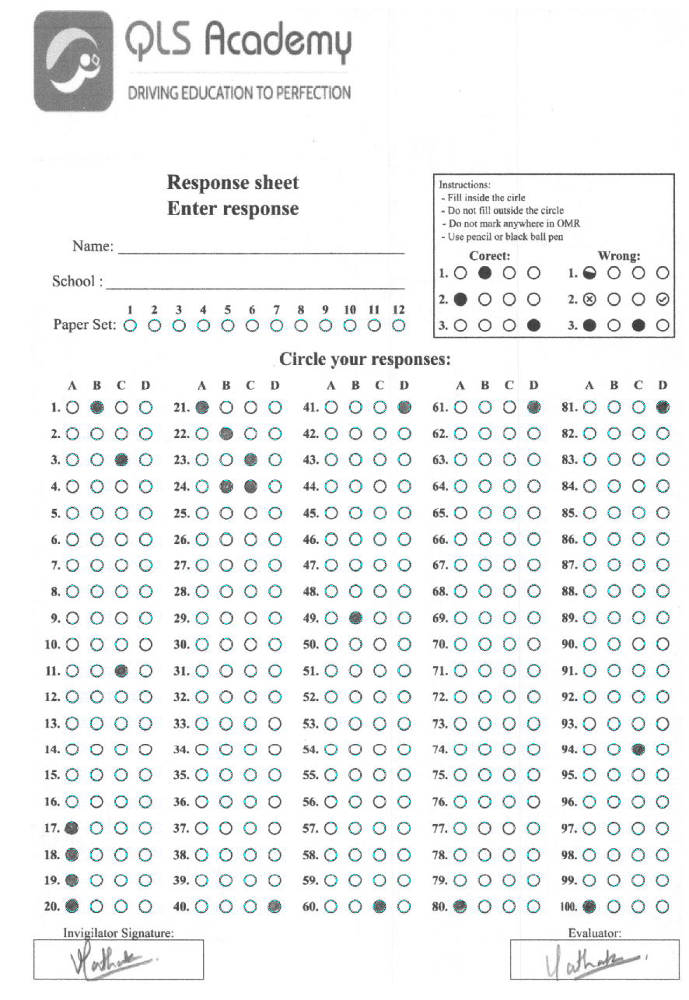

In [20]:
# draw bubbles
for bubble in answer_bubbles:
    if 'optimal_contour' in bubble:
        cv.circle(img_box_result,
              (bubble['mx'], bubble['my']), int(circle_r), (0,255,255), 1)

if SHOW_PROCESSING_STEPS:
    plt.figure(figsize=FIGSIZE)
    plt.axis("off")
    plt.imshow(img_box_result);


In [21]:
# classify bubbles into 'filled' and 'not filled'
mask = np.zeros((*img_box_th.shape,), np.uint8)
bubble_means = []
print(len(answer_bubbles))
for bubble in answer_bubbles:
    if 'optimal_contour' in bubble:
        mask[...] = 0
        cv.circle(mask, (bubble['mx'], bubble['my']), int(circle_r), 255, -1)
        bubble['mean'] = cv.mean(img_box_th, mask)[0]
        bubble_means.append(bubble['mean'])
filled_threshold = np.mean(bubble_means) * 0.9
for bubble in answer_bubbles:
    if 'optimal_contour' in bubble:
        bubble['is_filled'] = bubble['mean'] < filled_threshold

412


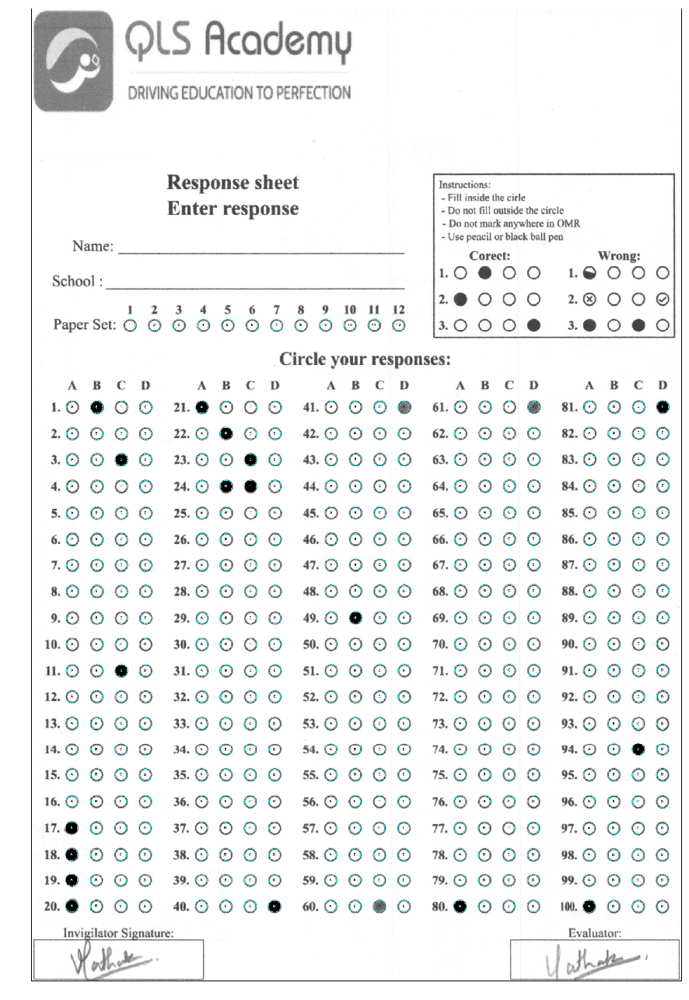

In [22]:
# draw bubbles according to the previous classification
font = cv.FONT_HERSHEY_PLAIN
#font = cv.FONT_HERSHEY_SIMPLEX
font_size = 0.7
bubble_color = (0, 255, 255)
#img_box_result = 255 * np.ones((*img_box_result.shape,), np.uint8)
img_box_result = cv.cvtColor(img_box, cv.COLOR_GRAY2BGR)
cv.rectangle(img_box_result, (0, 0), (img_box_result.shape[1], img_box_result.shape[0]), (0,0,0), 3)

for bubble in answer_bubbles:
    if 'optimal_contour' in bubble:
        if bubble['is_filled']:
            cv.circle(img_box_result,
                  (bubble['mx'], bubble['my']), int(circle_r), (0,0,0), -1)
        cv.circle(img_box_result,
              (bubble['mx'], bubble['my']), int(circle_r), bubble_color, 1)
        id_parts = bubble['id'].split('-')
        if len(id_parts) > 1:
            text = id_parts[1]
        else:
            text = id_parts[0]
        text = text.upper()
        # get boundary of this text
        textsize = cv.getTextSize(text, font, font_size, 1)
        # get coords based on boundary
        textX = bubble['mx'] - textsize[0][0] // 2
        textY = bubble['my'] + textsize[0][1] // 2
        cv.putText(img_box_result, text,
                   (textX, textY),
                   font, font_size,
                   (255,255,255) if bubble['is_filled'] else (0,0,0), 1, cv.LINE_AA)


plt.figure(figsize=FIGSIZE)
plt.axis("off")
plt.imshow(img_box_result);

In [23]:
# find all answers

answers = {}
for bubble in answer_bubbles:
    if 'optimal_contour' in bubble:
        id, pos = bubble['id'].split('-')
        if id in answers:
            answers[id][pos] = bubble['is_filled']
        else:
            answers[id] = {pos: bubble['is_filled']}
print(answers)
valid_answers = {}
for key in answers:
    try:
        q = int(key)
        if (q <= questions_count  and
            list(answers[key].values()).count(True) == 1):
            valid_answers[key] = answers[key]
    except:
        pass
print(valid_answers)
# get variant number
# print(answers['v'])
variant = 0
if ('v' in answers and len(answers['v']) ==  variants_count and 
    list(answers['v'].values()).count(True) == 1):
    variant = int(list(answers['v'].keys())[list(answers['v'].values()).index(True)])

if variant > 0:
    print("Paper set: {:2d}".format(variant))
else:
    print("Submitted answers!")
for q in sorted(valid_answers, key = lambda x: int(x)):
    ans = list(valid_answers[q].keys())[list(valid_answers[q].values()).index(True)]
    print("{:3d} -> {:s}".format(int(q), ans.upper()))

{'61': {'c': False, 'b': False, 'd': False, 'a': False}, '59': {'c': False, 'b': False, 'd': False, 'a': False}, '87': {'c': False, 'b': False, 'd': False, 'a': False}, '69': {'c': False, 'b': False, 'd': False, 'a': False}, '41': {'c': False, 'b': False, 'd': False, 'a': False}, '53': {'c': False, 'b': False, 'd': False, 'a': False}, '24': {'c': True, 'b': True, 'd': False, 'a': False}, '16': {'c': False, 'b': False, 'd': False, 'a': False}, '85': {'c': False, 'b': False, 'd': False, 'a': False}, '20': {'c': False, 'b': False, 'd': False, 'a': True}, '37': {'c': False, 'b': False, 'd': False, 'a': False}, '38': {'c': False, 'b': False, 'd': False, 'a': False}, '17': {'c': False, 'b': False, 'd': False, 'a': True}, '62': {'c': False, 'b': False, 'd': False, 'a': False}, '30': {'c': False, 'b': False, 'd': False, 'a': False}, '88': {'c': False, 'b': False, 'd': False, 'a': False}, '74': {'c': False, 'b': False, 'd': False, 'a': False}, '15': {'c': False, 'b': False, 'd': False, 'a': Fal